# Summary

Starting point for a supervised learning model for Ookla speed tiles. The data comes from a combination of 
Ookla Open Data speed tests and Statistics Canada information, including 2016 census population data and census boundaries (shapefiles). 


In [1]:
import sys
sys.path.append("..")

In [2]:
import src.config

In [3]:
from src.datasets.loading import statcan, ookla

In [4]:
import numpy as np 
import pandas as pd
import geopandas as gp

In [5]:
from sklearn import preprocessing, pipeline, compose
from sklearn import linear_model, model_selection, svm
from sklearn import metrics


In [7]:
import matplotlib.pyplot as plt 
import plotly.express as px
import pickle

## Load 
Load some of the available data. The census population data and StatCan boundaries are automatically loaded from 
the StatCan website. The overlays and tile geometries/speeds need to pre-computed and saved to the overlays directory and data directories. 

In [47]:
# Run cell to load all data
features_table = pd.read_pickle(r'data.pickle')


In [17]:
ab_data = features_table[features_table['PRUID'] == '48']
with open('data_AB.pickle', 'wb') as f:
    pickle.dump(ab_data, f)

In [51]:
# Run cell to load Alberta data
ab_data = pd.read_pickle(r'data_AB.pickle')


In [9]:
pkey = 'quadkey'
geometry = 'geometry'
id_and_names = ['DAUID', 'CDUID', 'CDNAME', 'CCSUID', 'CSDNAME', 'CMAUID', 'CMAPUID', 'CMANAME', 
'CCSNAME', 'CSDUID', 'ERUID', 'ERNAME', 'CTUID', 'CTNAME', 'ADAUID', 
'PCUID', 'PCNAME', 'PCPUID', 'SACCODE',] ##SACCODE is half a category half ID values

categorical_labels = [
    #'PRUID', #PRUID is redundant with PRNAME
    'PRNAME', 'CDTYPE', 
    'CSDTYPE',  
    'SACTYPE', 
    'CMATYPE', 'PCTYPE', 'PCCLASS',
]
numerical_vars = [
    'tests', 'devices',
    'das_area', 'tile_area', 'tile_frac',  'das_frac', 
    'DAPOP','POP_DENSITY'
]
target_vars = ['avg_d_kbps', 'avg_u_kbps']

In [10]:
print(features_table.dtypes)

quadkey           int64
geometry       geometry
avg_d_kbps      float64
avg_u_kbps      float64
tests             int64
devices           int64
DAUID             int64
PRUID            object
PRNAME           object
CDUID            object
CDNAME           object
CDTYPE           object
CCSUID           object
CCSNAME          object
CSDUID           object
CSDNAME          object
CSDTYPE          object
ERUID            object
ERNAME           object
SACCODE          object
SACTYPE          object
CMAUID           object
CMAPUID          object
CMANAME          object
CMATYPE          object
CTUID            object
CTNAME           object
ADAUID           object
das_area        float64
tile_area       float64
tile_frac       float64
das_frac        float64
DAPOP             int64
POP_DENSITY     float64
PCUID            object
PCNAME           object
PCTYPE           object
PCPUID           object
PCCLASS          object
dtype: object


In [19]:
col_subset = [pkey] + categorical_labels + numerical_vars + target_vars
features_table.loc[:,col_subset].set_index('quadkey')

,PRNAME,CDTYPE,CSDTYPE,SACTYPE,CMATYPE,PCTYPE,PCCLASS,tests,devices,das_area,tile_area,tile_frac,das_frac,DAPOP,POP_DENSITY,avg_d_kbps,avg_u_kbps
quadkey,,,,,,,,,,,,,,,,,
302231302213222,Ontario,RM,T,1,B,2,2,12,8,4.489387e+06,205331.876525,0.917314,0.041955,1420,316.301553,201908.916667,23286.833333
302231302230013,Ontario,RM,T,1,B,2,2,32,7,5.391016e+06,205402.379648,0.894827,0.034094,1030,191.058601,393118.031250,169457.281250
302231302230022,Ontario,RM,T,1,B,2,2,4,2,1.030375e+07,205472.906899,0.611219,0.012189,505,49.011263,19284.750000,4310.750000
302231302230023,Ontario,RM,T,1,B,2,2,128,13,1.765704e+06,205472.906900,0.871430,0.101407,795,450.245236,10499.585938,1387.898438
302231302230030,Ontario,RM,T,1,B,2,2,1,1,5.391016e+06,205437.640257,0.939933,0.035818,1030,191.058601,535.000000,889.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
303303002030011,Newfoundland and Labrador / Terre-Neuve-et-Lab...,CDR,T,5,NaN,NaN,NaN,1,1,1.777728e+07,179010.291685,0.579748,0.005838,350,19.688054,43155.000000,1901.000000
303303002032102,Newfoundland and Labrador / Terre-Neuve-et-Lab...,CDR,T,5,NaN,NaN,NaN,1,1,1.777728e+07,179287.191779,0.533632,0.005382,350,19.688054,1634.000000,690.000000
303303002122000,Newfoundland and Labrador / Terre-Neuve-et-Lab...,CDR,T,7,NaN,NaN,NaN,1,1,1.194131e+06,179256.404038,0.574792,0.086285,150,125.614323,37799.000000,12489.000000


In [24]:
def get_label_dict(labels):
    counts = {}

    # Loop through the list and count the occurrences of each element
    for l in set(labels):
        counts[l] = list(labels).count(l)

    # Print the dictionary
    return counts


def scatter_3d(df, x:str='CDTYPE', y:str='CSDTYPE', z:str='avg_d_kbps', color:str=''):
    if color=='':
        fig = px.scatter_3d(df, x=x, y=y, z=z)
    else:
        fig = px.scatter_3d(df, x=x, y=y, z=z, color=color)
    fig.update_layout(
        autosize=False,
        width=1000,
        height=700
    )
    fig.show()

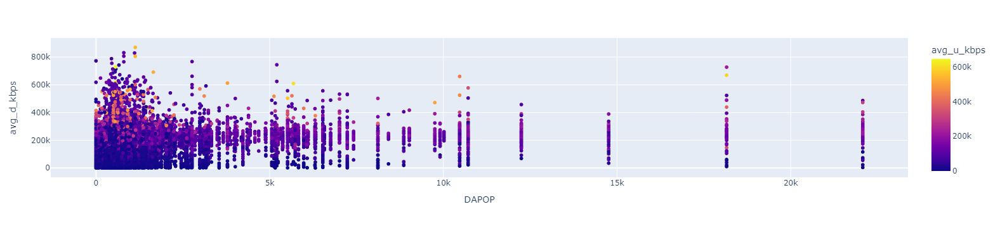

In [27]:
px.scatter(ab_data, x='DAPOP', y='avg_d_kbps', color='avg_u_kbps')

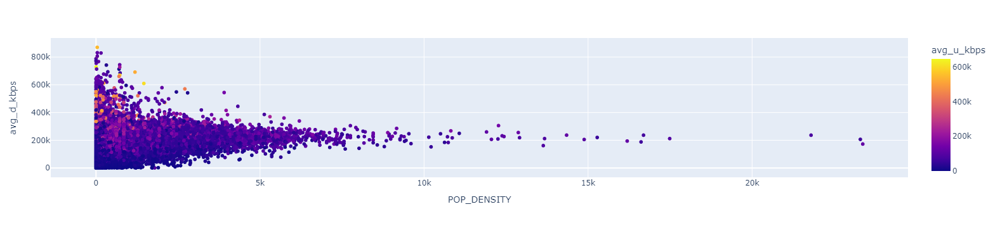

In [28]:
px.scatter(ab_data, x='POP_DENSITY', y='avg_d_kbps', color='avg_u_kbps')

In [41]:
scatter_3d(features_table.sample(50000), 'DAPOP', 'POP_DENSITY','avg_d_kbps', 'avg_u_kbps')

In [52]:
features_table['PCCLASS'] = features_table['PCCLASS'].replace({"2": "Small", "3": "Medium", "4": "Large", "": "Rural"})
ab_data['PCCLASS'] = ab_data['PCCLASS'].replace({"2": "Small", "3": "Medium", "4": "Large", "": "Rural"})

In [49]:
scatter_3d(features_table.sample(50000), 'DAPOP', 'POP_DENSITY','avg_d_kbps', 'PCCLASS')

In [53]:
scatter_3d(ab_data, 'DAPOP', 'POP_DENSITY','avg_d_kbps', 'PCCLASS')

### Interpretations

- Areas with very high population or population density do not get very high speeds. This may indicate that high population density causes increased interference or division of bandwidth. 

- Download speeds converge to a point around 200000 kbps as population densiity increases. 


- Data is scattered homogeneously around the origin 

In [31]:
#DBSCAN


eps = 1.4 
min_samples = 80
clustering = DBSCAN(eps=eps, min_samples=min_samples)

# create a pipeline with a preprocessing step and the OPTICS clustering step
pipe = pipeline.Pipeline([
    ('preprocess', colTransformer), # add a StandardScaler preprocessing step
    ('clustering', clustering)
])

pipe.fit(cluster_data)

labels = clustering.labels_


#kernel dies unexpectedly when working with only Alberta data

In [32]:
counts = {}

# Loop through the list and count the occurrences of each element
for l in labels:
    counts[l] = list(labels).count(l)

# Print the dictionary
print(counts)

{0: 157, -1: 1340, 1: 574, 2: 805, 3: 610, 4: 225, 5: 284, 6: 123, 7: 184, 8: 335, 9: 645, 10: 304, 11: 84, 12: 550, 13: 839, 19: 203, 14: 165, 15: 277, 16: 263, 17: 183, 18: 135, 20: 178, 21: 403, 22: 111, 23: 206, 26: 82, 24: 114, 25: 157, 27: 112, 28: 181, 29: 86, 30: 85}


In [33]:
len(counts)

32

In [34]:
clustering.labels_


array([ 0, -1,  1, ..., -1,  1,  4])

In [49]:
# Finding the best parameters for DBSCAN

# define parameter ranges
eps_range = np.linspace(0.01, 2.0, num=10)
min_samples_range = range(2,5)

# perform grid search
best_score = -1
best_params = {}
for eps in eps_range:
    for min_samples in min_samples_range:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        pipe = pipeline.Pipeline([
            ('preprocess', colTransformer), # add a StandardScaler preprocessing step
            ('clustering', dbscan)
        ])
        pipe.fit(cluster_data)
        if len(set(dbscan.labels_)) > 1 and len(set(dbscan.labels_)) <100:
            score = calinski_harabasz_score(pipe.named_steps["preprocess"].transform(cluster_data).toarray(), dbscan.labels_)
            print('(eps, min_samples) = ', (eps, min_samples))
            print('score = ', score)
            print('best_params = ', best_params)
            if score > best_score:
                best_score = score
                best_params = {'eps': eps, 'min_samples': min_samples}

# print best parameters
print('Best parameters:', best_params)


(eps, min_samples) =  (0.23111111111111113, 4)
score =  403.33934364149593
best_params =  {}
(eps, min_samples) =  (0.45222222222222225, 3)
score =  375.246381645161
best_params =  {'eps': 0.23111111111111113, 'min_samples': 4}
(eps, min_samples) =  (0.45222222222222225, 4)
score =  396.294073622461
best_params =  {'eps': 0.23111111111111113, 'min_samples': 4}
(eps, min_samples) =  (0.6733333333333333, 2)
score =  385.39549439637676
best_params =  {'eps': 0.23111111111111113, 'min_samples': 4}
(eps, min_samples) =  (0.6733333333333333, 3)
score =  391.7318000267073
best_params =  {'eps': 0.23111111111111113, 'min_samples': 4}
(eps, min_samples) =  (0.6733333333333333, 4)
score =  415.30480571497526
best_params =  {'eps': 0.23111111111111113, 'min_samples': 4}
(eps, min_samples) =  (0.8944444444444445, 2)
score =  399.6416155571852
best_params =  {'eps': 0.6733333333333333, 'min_samples': 4}
(eps, min_samples) =  (0.8944444444444445, 3)
score =  400.41452059323086
best_params =  {'eps':

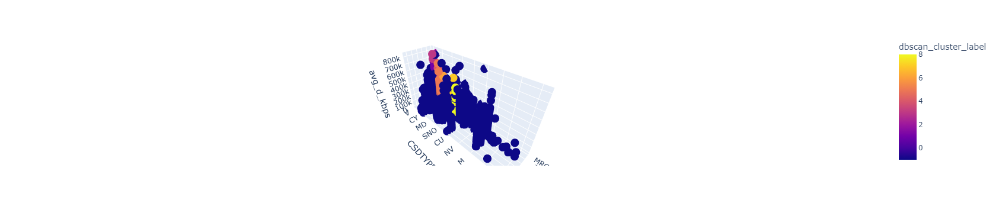

In [50]:
# dbscan = DBSCAN(eps=best_params['eps'], min_samples=int(best_params['min_samples']))
dbscan = DBSCAN(eps=0.1, min_samples=200)
pipe = pipeline.Pipeline([
    ('preprocess', colTransformer), # add a StandardScaler preprocessing step
    ('clustering', dbscan)
])
pipe.fit(cluster_data)
        
cluster_data['dbscan_cluster_label'] = dbscan.labels_
scatter_3d(cluster_data, x='CDTYPE', y='CSDTYPE', z='avg_d_kbps', color='dbscan_cluster_label')

Clustering results of the DBSCAN algorithm are not very conclusive when applied on the data with CDTYPE and CSDTYPE. Clusterings favored by the silhouette_score and calinski_harabasz_score validation indices tend to generate 60+ clusters, whereas davies_bouldin_score favors results with 2 clusters. Both are extreme cases and do not give interpretable results. 



In [37]:
# create an AgglomerativeClustering object with 2 clusters
clustering = AgglomerativeClustering(n_clusters=2)

colTransformer = compose.ColumnTransformer(
    [(f"{cat}",preprocessing.OneHotEncoder(),[cat]) for cat in set(categorical_labels) & set(cluster_features)] \
    + [(f"{num}", preprocessing.StandardScaler(), [num]) for num in set(numerical_vars) & set(cluster_features)] 
)
clustering_pipe = pipeline.Pipeline([
    ('preprocess',colTransformer),
    ('to_dense', preprocessing.FunctionTransformer(lambda X: X.toarray() if hasattr(X, 'toarray') else X.values)),
    ('clustering', clustering)
])

clustering_pipe.fit(cluster_data)

labels = clustering.labels_

cluster_data['hc_labels'] = labels

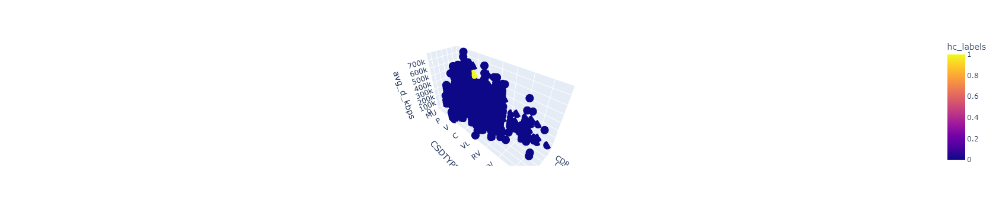

In [38]:
scatter_3d(cluster_data, color='hc_labels')

In [39]:
params = {'n_clusters': range(2, 10), 'linkage': ['ward', 'complete', 'average']}
clustering_pipe = pipeline.Pipeline([
    ('preprocess',colTransformer),
    ('to_dense', preprocessing.FunctionTransformer(lambda X: X.toarray() if hasattr(X, 'toarray') else X.values)),
    ('clustering', clustering)
])

grid_search = GridSearchCV(clustering_pipe, param_grid=params, scoring='silhouette')
grid_search.fit(cluster_data)

ValueError: 'silhouette' is not a valid scoring value. Use sklearn.metrics.get_scorer_names() to get valid options.

In [40]:
# Finding the best parameters for HC

# define parameter ranges
params = {'n_clusters': range(2, 10), 'linkage': ['ward', 'complete', 'average']}


# perform grid search
best_score = -1
best_params = {}
for n_clusters in params['n_clusters']:
    for linkage in params['linkage']:
        clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
        pipe = pipeline.Pipeline([
            ('preprocess',colTransformer),
            ('to_dense', preprocessing.FunctionTransformer(lambda X: X.toarray() if hasattr(X, 'toarray') else X.values)),
            ('clustering', clustering)
        ])
        pipe.fit(cluster_data)
        score = calinski_harabasz_score(pipe.named_steps["preprocess"].transform(cluster_data).toarray(), clustering.labels_)
        print('(n_clusters, linkage) = ', (n_clusters, linkage))
        print('score = ', score)
        print('best_params = ', best_params)
        if score > best_score:
            best_score = score
            best_params = {'n_clusters': n_clusters, 'linkage': linkage}

# print best parameters
print('Best parameters:', best_params)

(n_clusters, linkage) =  (2, 'ward')
score =  1796.6375157615919
best_params =  {}
(n_clusters, linkage) =  (2, 'complete')
score =  1071.9096895216012
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (2, 'average')
score =  1071.9096895216012
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (3, 'ward')
score =  1659.9073900865137
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (3, 'complete')
score =  764.940266904047
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (3, 'average')
score =  682.9370170376574
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (4, 'ward')
score =  1725.605982396218
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (4, 'complete')
score =  866.3120592333775
best_params =  {'n_clusters': 2, 'linkage': 'ward'}
(n_clusters, linkage) =  (4, 'average')
score =  801.1082720389045
best_params =  {'n

It appears that for n_clusters >2 ward linkage gives better results. 


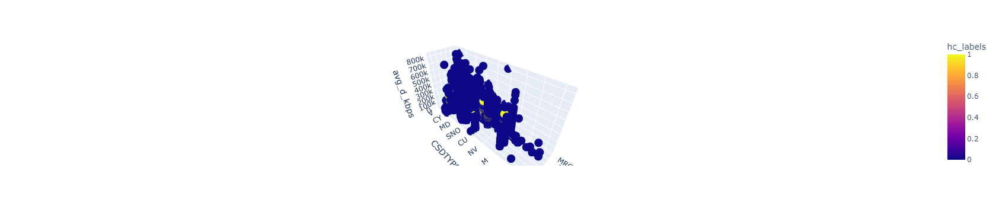

In [51]:
clustering = AgglomerativeClustering(n_clusters=2, linkage='ward')

colTransformer = compose.ColumnTransformer(
    [(f"{cat}",preprocessing.OneHotEncoder(),[cat]) for cat in set(categorical_labels) & set(cluster_features)] \
    + [(f"{num}", preprocessing.StandardScaler(), [num]) for num in set(numerical_vars) & set(cluster_features)] 
)
clustering_pipe = pipeline.Pipeline([
    ('preprocess',colTransformer),
    ('to_dense', preprocessing.FunctionTransformer(lambda X: X.toarray() if hasattr(X, 'toarray') else X.values)),
    ('clustering', clustering)
])

clustering_pipe.fit(cluster_data)

labels = clustering.labels_

cluster_data['hc_labels'] = labels
scatter_3d(cluster_data, color='hc_labels')

In [48]:
#OPTICS

params = {'min_samples': range(2, 10), 'xi': np.linspace(0.01, 0.1, num=10)}

# create an OPTICS object
clustering = OPTICS(min_samples=2, xi=0.5, metric='l2')

# create a pipeline with a preprocessing step and the OPTICS clustering step
pipe = pipeline.Pipeline([
    ('preprocess', colTransformer), # add a StandardScaler preprocessing step
    ('clustering', clustering)
])

pipe.fit(cluster_data)

labels = clustering.labels_

# Getting a divide by zero exception. 

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_optics.py:932: RuntimeWarning:

divide by zero encountered in divide



In [1]:
!pwd

/home/jovyan/notebooks
